<a href="https://colab.research.google.com/github/srikumarA/Study_Assistant/blob/main/Dog_Identification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import pandas as pd
import numpy as np


In [ ]:
#!unzip "/content/drive/MyDrive/Dog data/dog-breed-identification.zip" -d "/content/drive/MyDrive/Dog data/"

# 🐕 end-end mutil-class dog breed classification

## 1. Problem
Identifying the breed of a dog from a given image.

## 2. Data
Kaggle competition data

## 3. Evaluation
Multi class log loss- prediction probabilities.

## 4. Features
Unstructured(images) 120 classes
therefore we will be using deep learning, transfer learning
* there are 10k images each in training and test data.

# Getting our workspace ready

* Import Tensorflow ✅
* Import Tensorflow Hub ✅
* GPU ✅

In [ ]:
#importing tensorflow latest 2.11
import tensorflow as tf
print("TF version: ",tf.__version__)

TF version:  2.12.0


In [ ]:
import tensorflow_hub as hub
print("Hub version: ",hub.__version__)
#checking GPU availability
print(tf.config.list_physical_devices("GPU"))

Hub version:  0.13.0
[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


## getting our data ready(into tensors)
We are changing the images to numerical data i..e, tensors.

In [ ]:
labels_csv=pd.read_csv('/content/drive/MyDrive/Dog data/labels.csv')

In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


<Axes: >

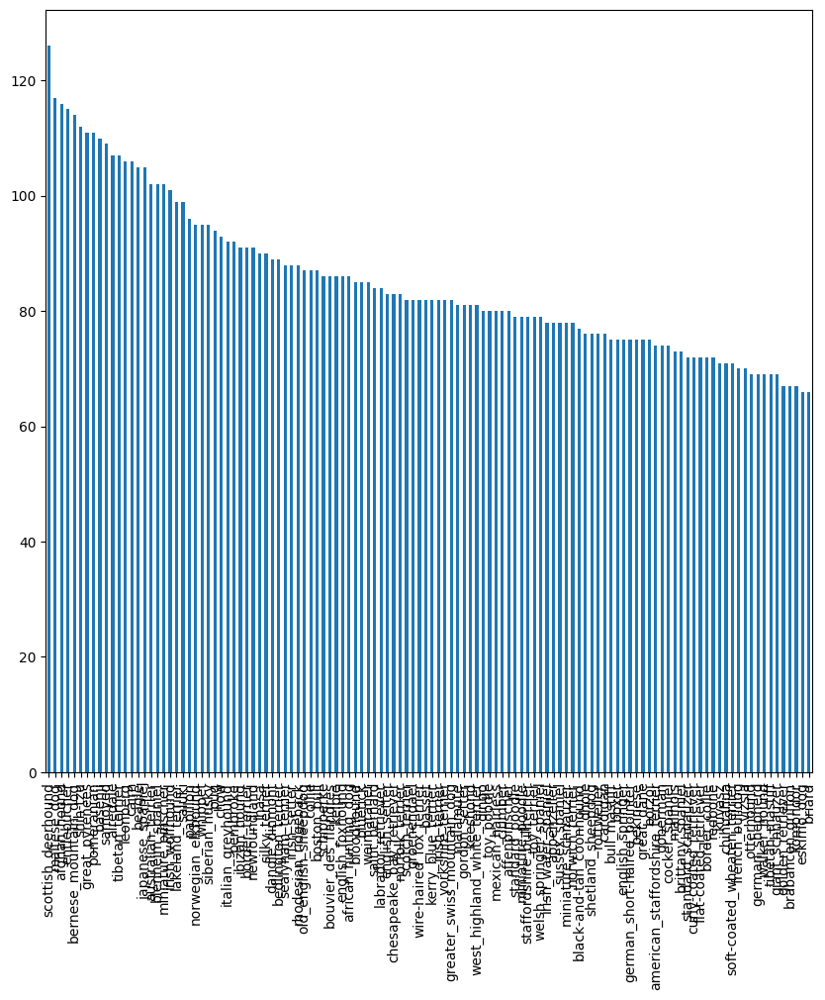

In [ ]:
#how many images are there for each breed
labels_csv["breed"].value_counts().plot.bar(figsize=(10,10))

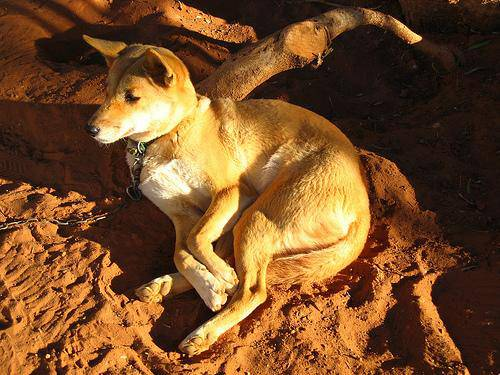

In [ ]:
#viewing an image
from IPython.display import Image
Image('/content/drive/MyDrive/Dog data/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg')

 # getting images and their labels
 lets get a list of all our image file path name

In [ ]:
filenames=['/content/drive/MyDrive/Dog data/train/'+fname for fname in labels_csv["id"]+'.jpg']
filenames


['/content/drive/MyDrive/Dog data/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/Dog data/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/Dog data/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/Dog data/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/Dog data/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/drive/MyDrive/Dog data/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/drive/MyDrive/Dog data/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/drive/MyDrive/Dog data/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/drive/MyDrive/Dog data/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '/content/drive/MyDrive/Dog data/train/0042188c895a2f14ef64a918ed9c7b64.jpg',
 '/content/drive/MyDrive/Dog data/train/004396df1acd0f1247b740ca2b14616e.jpg',
 '/content/drive/MyDrive/Dog data/train/0067dc3eab0b3c3ef0439477624d85d6.jpg',
 '/content/drive/MyDrive/Dog data/train/00693b8bc247

In [ ]:
#check whether the number of filenames matches with number of images
import os
if len(os.listdir('/content/drive/MyDrive/Dog data/train/'))==len(filenames):
  print("Yeah boi")
print(len(filenames))
print(len(os.listdir('/content/drive/MyDrive/Dog data/train/')))

10222
5850


In [ ]:
unique_lab=np.unique(labels_csv["breed"])
len(np.unique(labels_csv["breed"]))


120

In [ ]:
#label -> boolean array
bool_lab=[label==unique_lab for label in labels_csv['breed']]
bool_lab

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
for i in range(len(bool_lab)):
  bool_lab[i]=bool_lab[i].astype(int)
print(bool_lab[0])

[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
#setting up x and y
x=filenames
y=bool_lab


Starting with 1000 images and then increase as needed.

In [ ]:
NUM_IMAGES=1000 #@param{type:"slider",min:1000,max:5840,step:100}

In [ ]:
#splitting the data into training and validation sets
from sklearn.model_selection import train_test_split

#split them
x_train,x_test,y_train,y_test=train_test_split(x[:NUM_IMAGES],y[:NUM_IMAGES],test_size=0.2,random_state=43)
len(x_train), len(x_test)

(800, 200)

##Preprocessing images

to preprocess our images into tensors we're going to write a function which does:
1. Take an image to read filepath as input.
2. Use TensorFlow to read the file and save it to a variable image.
3. Turn our image into Tensors
4. Resize the image to be a shape of(224,224)
5. Retuen the modified image.

In [ ]:
#preprocessing images into tensor


#convert to numpy array
from matplotlib.pyplot import imread
image=imread(filenames[42])
image.shape

(257, 350, 3)

In [ ]:
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)>

In [ ]:
image[:2]

array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)

In [ ]:
#function to preprocess the images

img_size=224

def process_image(img_path,img_size=224):
  """
  Takes an image's path and turns it into tensors
  """
  #read
  img=tf.io.read_file(img_path)
  #turning the jpeg img to numerical tensor RGB
  img=tf.image.decode_jpeg(img,channels=3)
  #Normalization of colour
  img=tf.image.convert_image_dtype(img,tf.float32)
  #resize the image to our desired value
  img=tf.image.resize(img,size=[img_size,img_size])

  return img


# turning our data into batches
Why do we have to?

the main agenda is to train models with a batch of images at a time to avoid memory space related issues. GPU provides speed but the amount of memory is limited.

to improve the efficiency of tensorflow we have to turn out data into tuples (image,label)

In [ ]:
#function for getting into tuples
def get_img_tuple(img_path,label):
  img=process_image(img_path,img_size)
  return img,label


In [ ]:
(get_img_tuple(x[43],y[43]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.6932511 , 0.6422707 , 0.50893736],
         [0.7049195 , 0.6539391 , 0.51668423],
         [0.7189601 , 0.66415447, 0.5268996 ],
         ...,
         [0.28510195, 0.23804314, 0.19098432],
         [0.23658979, 0.18953097, 0.14247213],
         [0.17295183, 0.13373615, 0.08667732]],
 
        [[0.68057597, 0.6295956 , 0.49626228],
         [0.69162816, 0.64064777, 0.50731444],
         [0.706784  , 0.6519783 , 0.51481974],
         ...,
         [0.29755813, 0.2504993 , 0.20344049],
         [0.24967629, 0.20261747, 0.15555863],
         [0.18719192, 0.14797622, 0.10091741]],
 
        [[0.6738776 , 0.6228972 , 0.49740702],
         [0.6841212 , 0.6331408 , 0.5004377 ],
         [0.7016797 , 0.64304876, 0.51417094],
         ...,
         [0.25748226, 0.21042345, 0.16336462],
         [0.23216338, 0.18510455, 0.13804573],
         [0.17874685, 0.13953117, 0.09247234]],
 
        ...,
 
        [[0.56411815, 0.5932849 

In [ ]:
# turn all our data into batches of size :25 default is 32
batch_size=32
def create_batch(x,y=None,batch_size=batch_size,valid_data=False,test_data=False):
  """
  Creates the image,label tuple batches of size n
  shuffles the training data but not the validation data.
  also accepts test data as y=None default
  """
  if test_data:
    print("Creating test data batches...")
    data=tf.data.Dataset.from_tensor_slices((tf.constant(x)))
    data_batch=data.map(process_image).batch(batch_size)
    return data_batch
  elif valid_data:
    print("Creating validation data batches...")
    data=tf.data.Dataset.from_tensor_slices((tf.constant(x),tf.constant(y)))

    data_batch=data.map(get_img_tuple).batch(batch_size)
    return data_batch
  else:
    print("Creating training data batches...")
    data=tf.data.Dataset.from_tensor_slices((tf.constant(x),tf.constant(y)))
    data=data.shuffle(buffer_size=len(x))
    data=data.map(get_img_tuple)
    data_batch=data.batch(batch_size)
    return data_batch

In [ ]:
#creating training and validation batches
train_data=create_batch(x_train,y_train)
val_data=create_batch(x_test,y_test,valid_data=True)


Creating training data batches...
Creating validation data batches...


In [ ]:
train_data.element_spec,val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.int32, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.int32, name=None)))

## Visualizing Data batches

our data is now in batches, however, these can be a little hard to understand/comprehend, let's visualize the batch.

In [ ]:
import matplotlib.pyplot as plt

#Create a function for viewing iimages as batches
def show_25_images(images,labels):
  """
  Displays 25 images as a plot and their labels from data batch.
  """

  #setup figure
  plt.figure(figsize=(10,10))
  #loop through 25 imgs
  for i in range(25):
    #create subplots(5x5)
    ax=plt.subplot(5,5,i+1)
    #Display an image
    plt.imshow(images[i])
    #labels
    plt.title(unique_lab[labels[i].argmax()])
    plt.axis("off")

In [ ]:
train_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.int32, name=None))>

In [ ]:
train_images,train_labels=next(train_data.as_numpy_iterator())
train_images,train_labels

(array([[[[4.00398016e-01, 4.48309988e-01, 3.20184320e-01],
          [3.62499416e-01, 4.37954605e-01, 3.00286382e-01],
          [4.45401937e-01, 5.54412365e-01, 4.03578013e-01],
          ...,
          [3.40482175e-01, 4.03227299e-01, 3.00473064e-01],
          [2.85376370e-01, 3.80684584e-01, 2.84367919e-01],
          [3.51041317e-01, 4.53002095e-01, 3.54962885e-01]],
 
         [[4.23540384e-01, 4.59741443e-01, 3.26999873e-01],
          [3.44649106e-01, 4.14862543e-01, 2.68878818e-01],
          [3.62693518e-01, 4.62938011e-01, 3.06758344e-01],
          ...,
          [2.88965225e-01, 3.48874182e-01, 2.55334586e-01],
          [2.15401664e-01, 3.07443202e-01, 2.05647200e-01],
          [2.19831407e-01, 3.16119909e-01, 2.15244561e-01]],
 
         [[3.81554842e-01, 4.06385720e-01, 2.65804470e-01],
          [4.27397549e-01, 4.80023593e-01, 3.28658044e-01],
          [3.39094698e-01, 4.26074833e-01, 2.70957440e-01],
          ...,
          [1.50440678e-01, 2.08458886e-01, 1.3654

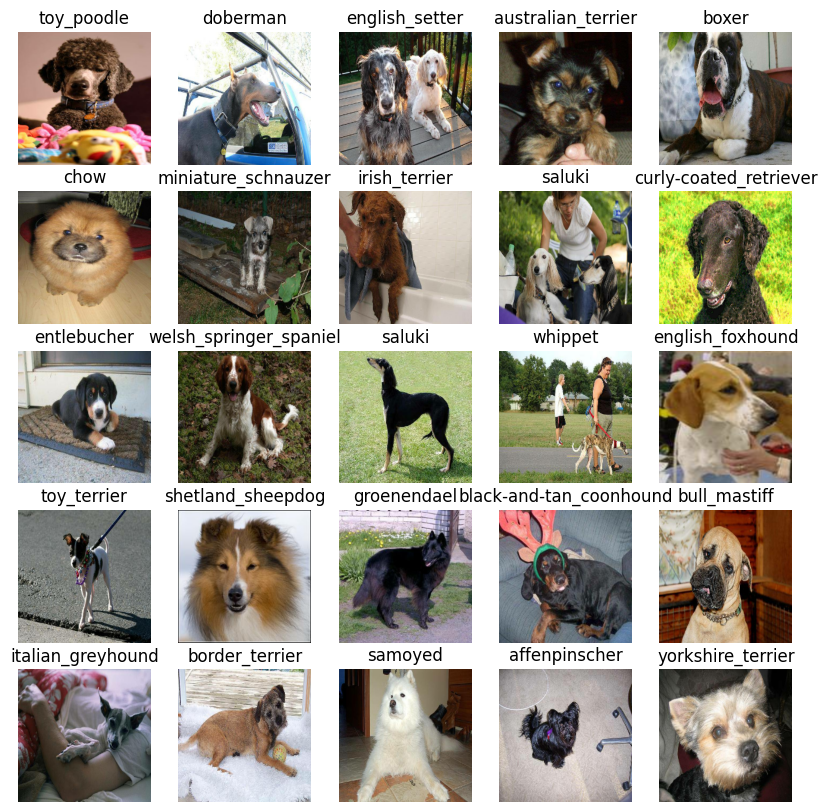

In [ ]:
show_25_images(train_images,train_labels)

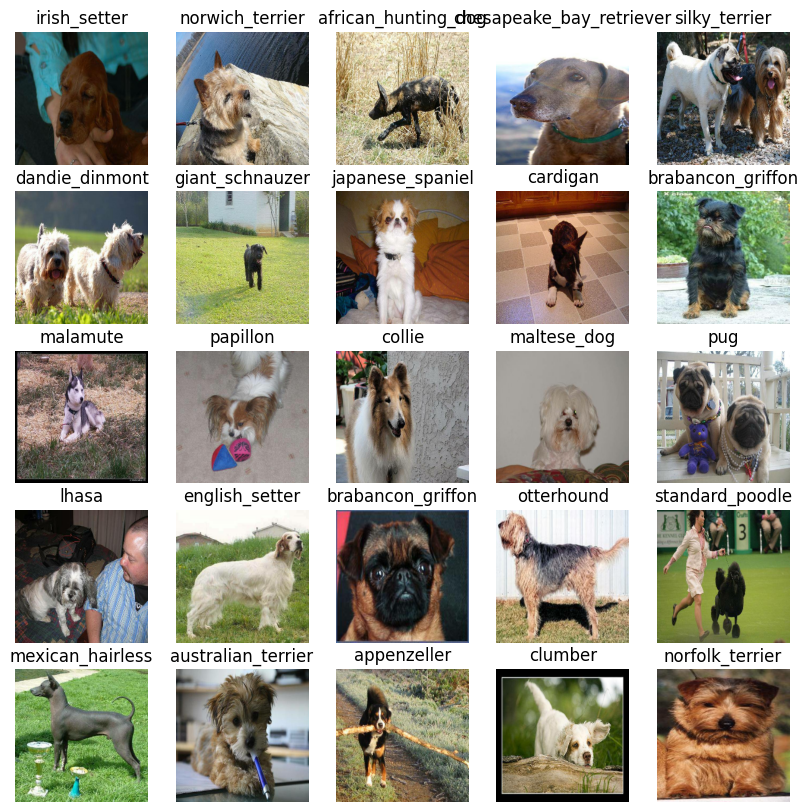

In [ ]:
#visualizing validation sets
val_images,val_labels=next(val_data.as_numpy_iterator())
show_25_images(val_images,val_labels)

## Building a model

before we build a model, there are a few things we need to define:
* The input shape(our images in the form of tensors)
* The output shape (image labels in the form of tensors)
* The URL of the model we want to use from tf hub
https://tfhub.dev/.

In [ ]:
#setup input shape of the model
INPUT_SHAPE=[None,img_size,img_size,3]

#output shape
OUTPUT_SHAPE=len(unique_lab)

#setup model URL from tensorflow Hub

MODEL_URL="https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5"


Now we got our inputs, outputs, models ready to go. Lets put them together into a keras deep learning model!

knowing this, lets create a function which:
* Takes the input shape, output shape and model we've chosen as parameters.
* Defines the layers in a keras model in sequential fashion.
* Compiles the model.
* Builds the model.
* Returns the model

All of these steps can be found in tfhub/dev

In [ ]:
#creating a function to build a keras model
def create_model(input_shape=INPUT_SHAPE,output_shape=OUTPUT_SHAPE,model_url=MODEL_URL):
  print("Model: ",model_url)

  #setup
  model=tf.keras.Sequential([
      hub.KerasLayer(model_url),
      tf.keras.layers.Dense(units=output_shape,activation='softmax')
  ])
  model.compile(
  loss=tf.keras.losses.CategoricalCrossentropy(),
  optimizer=tf.keras.optimizers.Adam(),
  metrics=["accuracy"]
  )

  #building a model
  model.build(input_shape)
  return model


In [ ]:
model=create_model()
model.summary()

Model:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


## Creating callbacks

Callbacks are helper functions a model can use during training to do things such as saving its progress, checking its progress or stop training early if a model stops improving.

We'll create two callbacks , one for tensorboard which helps our models progress and another for stopping our model early to avoid overfitting.

### TensorBoard Callback

To setup a tensorboard callback, we need to do 3 things:

1. Load the tensorboard notebook extension.
2. Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's `fit()` function.
3. Visualize our models training logs with the %tensorboard magic function(post training)

In [ ]:
#Load TensorBoard notebook extension
%load_ext tensorboard

In [ ]:
import datetime

#create a function to build a tensorflow callback

def create_tensorboard_callback():
  #create a directory for storing logs
  logdir=os.path.join("/content/drive/MyDrive/Dog data/logs",datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

## Early Stopping callback

Early stopping helps stop our model from overfitting by stopping training if a certain evaluation metric stops

https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping

In [ ]:
#create earlystopping callback
early_stopping=tf.keras.callbacks.EarlyStopping(monitor='val_accuracy',patience=3)

In [ ]:
#training our model

NUM_EPOCHS=100 #@param {type:"slider",max:100,min:10,step:10}

In [ ]:
print("GPU","availabla(YES!)" if tf.config.list_physical_devices("GPU") else "Not available")

GPU availabla(YES!)


Lets create a function which trains a model.

* create a model using `create_model()`
* setup a TensorBoard callback using `create_tensorboard_callback()`
* call the `fit()` function on our model passing it the training data, validation data, number epochs
* return the model


In [ ]:
#Build a function for training

def train_model():
  """
  Trains a given model and returns trained version.
  """

  #create a model
  model=create_model()

  tensorboard=create_tensorboard_callback()

  #fitting
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard,early_stopping])

  return model

In [ ]:
model=train_model()

Model:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/100
25/25 [==============================] - 17s 161ms/step - loss: 4.6178 - accuracy: 0.0763 - val_loss: 3.1705 - val_accuracy: 0.3000
Epoch 2/100
25/25 [==============================] - 3s 112ms/step - loss: 1.6868 - accuracy: 0.6787 - val_loss: 1.8831 - val_accuracy: 0.5350
Epoch 3/100
25/25 [==============================] - 4s 159ms/step - loss: 0.5894 - accuracy: 0.9350 - val_loss: 1.3784 - val_accuracy: 0.7000
Epoch 4/100
25/25 [==============================] - 3s 111ms/step - loss: 0.2566 - accuracy: 0.9887 - val_loss: 1.2010 - val_accuracy: 0.7300
Epoch 5/100
25/25 [==============================] - 3s 114ms/step - loss: 0.1494 - accuracy: 1.0000 - val_loss: 1.1195 - val_accuracy: 0.7450
Epoch 6/100
25/25 [==============================] - 3s 114ms/step - loss: 0.1032 - accuracy: 1.0000 - val_loss: 1.0778 - val_accuracy: 0.7450
Epoch 7/100
25/25 [==============================] - 3s 123ms

### Checking the tensorboard logs

The Tensorboard magic function(`%tensorboard`) will access the logs directory we created earlier and visualize its contents.

In [ ]:
%tensorboard --logdir drive/My\ Drive/Dog\ data/logs

<IPython.core.display.Javascript object>

## Making and evaluating predictions using a trained model

In [ ]:
# similar to ml predictions
predictions=model.predict(val_data,verbose=1)
predictions

7/7 [==============================] - 4s 82ms/step


array([[7.3268704e-05, 2.4210562e-03, 1.8676794e-05, ..., 2.0891062e-05,
        1.4131260e-03, 3.7902978e-04],
       [2.6788840e-03, 9.2209273e-05, 1.0215703e-04, ..., 6.3695799e-04,
        1.8052151e-03, 1.4142992e-01],
       [2.2653976e-04, 1.0118459e-03, 5.7172161e-01, ..., 6.7573227e-04,
        8.4157730e-04, 3.1392402e-03],
       ...,
       [5.4278011e-05, 1.5461468e-03, 4.6163466e-04, ..., 8.0964295e-03,
        9.4202883e-04, 5.1500270e-04],
       [4.1665885e-06, 1.8504408e-05, 1.9894162e-05, ..., 4.6914193e-04,
        8.1487879e-04, 5.0585345e-06],
       [4.3894898e-04, 2.7098602e-03, 2.1049727e-04, ..., 2.5372265e-03,
        1.2239600e-03, 6.1739539e-04]], dtype=float32)

In [ ]:
predictions.shape

(200, 120)

In [ ]:
# 120 is unique breeds and 200 is the size of validation set.
idx=0
print(f"Max value in terms of probability: {np.max(predictions[idx])}")
print("pred label: ",unique_lab[np.argmax(predictions[idx])])

Max value in terms of probability: 0.7273223400115967
pred label:  irish_setter


In [ ]:
#functionalising the predictions
def get_pred_label(prediction_probab):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_lab[np.argmax(prediction_probab)]

pred_label=get_pred_label(predictions[81])
pred_label

'chesapeake_bay_retriever'

In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.int32, name=None))>

Since our validation dataset is in batch
dataset, lets unbatch them to get the individual data so that we can take a look at it.

In [ ]:
images_=[]
labels_=[]

#loop through unbatched data

for image,label in val_data.unbatch().as_numpy_iterator():
  images_.append(image)
  labels_.append(label)

images_[0],labels_[0]

(array([[[0.2901961 , 0.2392157 , 0.20392159],
         [0.2901961 , 0.2392157 , 0.20392159],
         [0.2901961 , 0.2392157 , 0.20392159],
         ...,
         [0.16054587, 0.3800004 , 0.38399866],
         [0.14842434, 0.38431376, 0.38823533],
         [0.14509805, 0.38431376, 0.38823533]],
 
        [[0.2901961 , 0.2392157 , 0.20392159],
         [0.2901961 , 0.2392157 , 0.20392159],
         [0.2901961 , 0.2392157 , 0.20392159],
         ...,
         [0.15815192, 0.37712958, 0.38090625],
         [0.14556195, 0.38145137, 0.38537294],
         [0.14223565, 0.38145137, 0.38537294]],
 
        [[0.2901961 , 0.2392157 , 0.20392159],
         [0.2901961 , 0.2392157 , 0.20392159],
         [0.2901961 , 0.2392157 , 0.20392159],
         ...,
         [0.15608189, 0.37505955, 0.37710428],
         [0.14463165, 0.3803922 , 0.38431376],
         [0.14202556, 0.3803922 , 0.38431376]],
 
        ...,
 
        [[0.13267674, 0.19150028, 0.16404928],
         [0.14594704, 0.19300587, 0.18253

In [ ]:
get_pred_label(labels_[0])

'irish_setter'

In [ ]:
get_pred_label(predictions[0])

'irish_setter'

In [ ]:
#lets functionize it
def unbatchify(data):
  """
  Takes tensors and returns separate lists of images as=nd labels.
  """
  im=[]
  lb=[]
  for i,j in data.unbatch().as_numpy_iterator():
    im.append(i)
    lb.append(unique_lab[np.argmax(j)])
  return im,lb

val_images,val_labels=unbatchify(val_data)

In [ ]:
val_images

[array([[[0.2901961 , 0.2392157 , 0.20392159],
         [0.2901961 , 0.2392157 , 0.20392159],
         [0.2901961 , 0.2392157 , 0.20392159],
         ...,
         [0.16054587, 0.3800004 , 0.38399866],
         [0.14842434, 0.38431376, 0.38823533],
         [0.14509805, 0.38431376, 0.38823533]],
 
        [[0.2901961 , 0.2392157 , 0.20392159],
         [0.2901961 , 0.2392157 , 0.20392159],
         [0.2901961 , 0.2392157 , 0.20392159],
         ...,
         [0.15815192, 0.37712958, 0.38090625],
         [0.14556195, 0.38145137, 0.38537294],
         [0.14223565, 0.38145137, 0.38537294]],
 
        [[0.2901961 , 0.2392157 , 0.20392159],
         [0.2901961 , 0.2392157 , 0.20392159],
         [0.2901961 , 0.2392157 , 0.20392159],
         ...,
         [0.15608189, 0.37505955, 0.37710428],
         [0.14463165, 0.3803922 , 0.38431376],
         [0.14202556, 0.3803922 , 0.38431376]],
 
        ...,
 
        [[0.13267674, 0.19150028, 0.16404928],
         [0.14594704, 0.19300587, 0.18253

#Now we have got ways to get

* Prediction labels
* validation labels
* Validation images

Lets make some functions to visualize these results.

we'll create a function which:
* Takes an array of prediction probabilities, an array of truth labels and an array of images and integers.
* Convert prediction probabilities to a predicted label.
* Plot the predicted label, its predicted probability, the truth label and the target image on a single plot.


In [ ]:
#function
def plot_pred(prediction_probabilities,labels,images,n=73):
  """
  View the prediction, ground truth and image for sample n
  """
  pred_prob,true_label,image=prediction_probabilities[n],labels[n],images[n]

  #get pred label
  pred_label=get_pred_label(pred_prob)

  #plot the image
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])
  if pred_label==true_label:
    color='green'
  else:
    color='red'
  plt.title("{} {:2.0f}% {}".format(pred_label,np.max(pred_prob)*100,true_label),color=color)

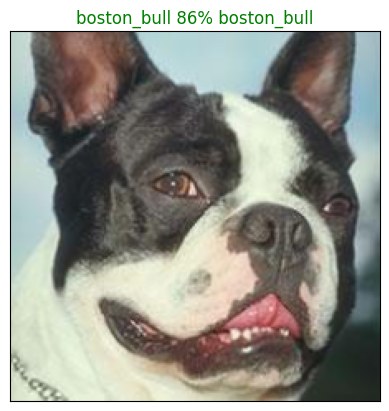

In [ ]:
plot_pred(predictions,val_labels,val_images)

We are going to create a function to get the top n predictions.

this function will:
* input: probabilities array, ground truth, integer
* finding preddiction using `get_pred_label()`
* find the top 10:
* prediction probabilities indices
* prediction probabilities values
* prediction labels

* plot them

In [ ]:
def plot_pred_conf(prediction_probabilities,labels,n=1):
  """
  plus the top 10 highest confidences along with the truth label for sample n.
  """
  pred_prob,true_label=prediction_probabilities[n],labels[n]
  # get the predicted label
  pred_label=get_pred_label(pred_prob)

  #finding the top 10
  top_10_pred_indexes=predictions[n].argsort()[-10:][::-1]
  top_10_pred_values=pred_prob[top_10_pred_indexes]
  top_10_pred_labels=unique_lab[top_10_pred_indexes]

  #setting up the plot
  top_plot=plt.bar(np.arange(len(top_10_pred_labels)),top_10_pred_values,color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")
  if np.isin(true_label,top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels==true_label)].set_color("green")
  else:
    pass

In [ ]:
predictions[0].argsort()[-10:][::-1]

array([ 56,  49,  14,  32,  89,   8, 115,  13,  93,  57])

In [ ]:
len(predictions)

200

'giant_schnauzer'

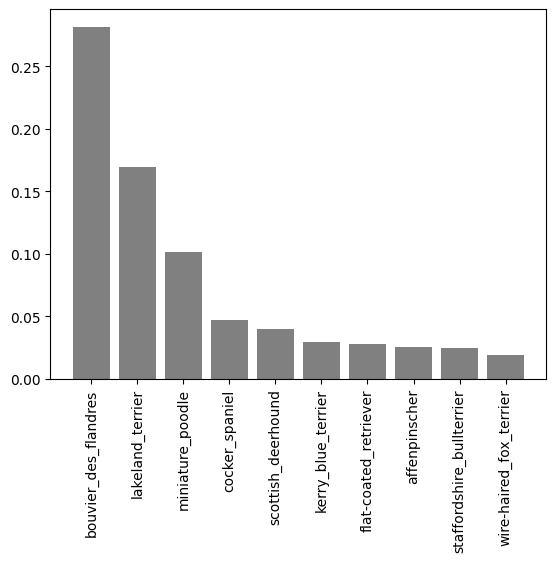

In [ ]:
plot_pred_conf(predictions,val_labels,n=6)
val_labels[6]

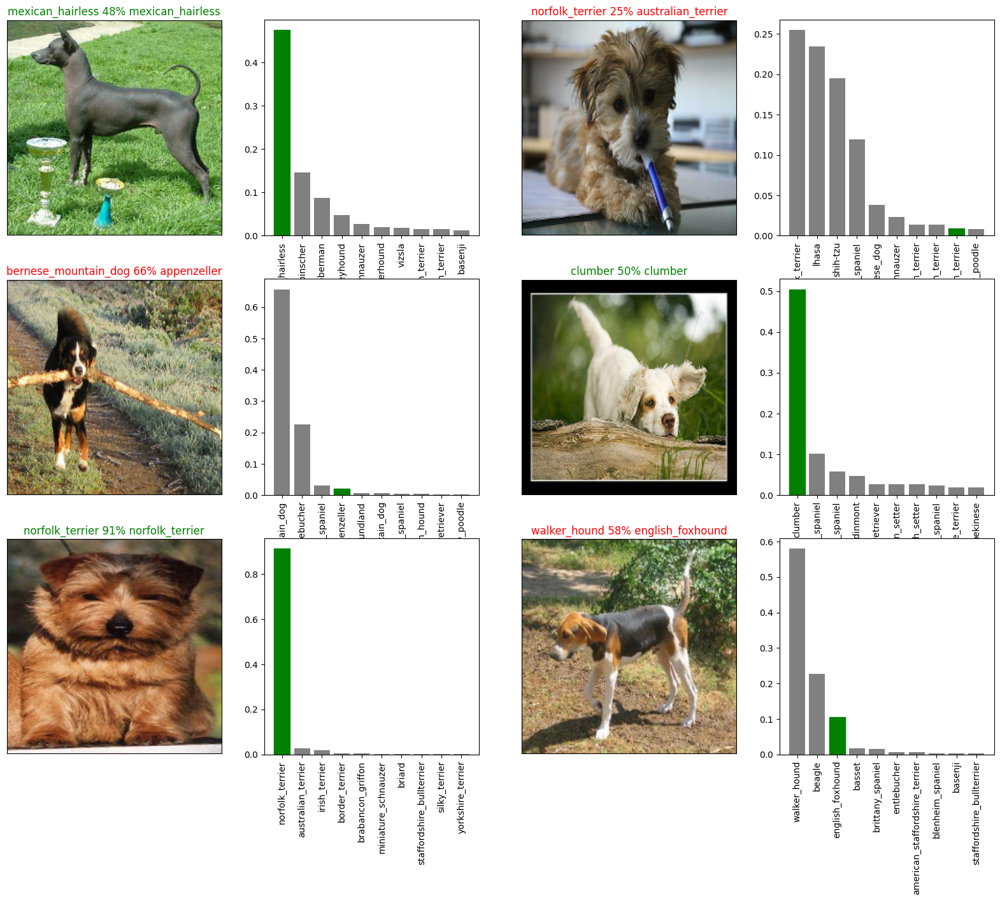

In [ ]:

i_multiplier=20
num_rows=3
num_cols=2
num_images=num_rows*num_cols
plt.figure(figsize=(10*num_cols,5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows,2*num_cols,2*i+1)
  plot_pred(predictions,val_labels,val_images,n=i+i_multiplier)
  plt.subplot(num_rows,2*num_cols,2*i+2)
  plot_pred_conf(predictions,val_labels,n=i+i_multiplier)
plt.show()


Andrei has challenged you to create a confusion matrix with the models prediction and true labels

In [ ]:
#lets take on the challenge
from sklearn.metrics import confusion_matrix
pred_labels=[]
for i in predictions:
  pred_labels+=[get_pred_label(i)]
pred_labels

['irish_setter',
 'norfolk_terrier',
 'african_hunting_dog',
 'chesapeake_bay_retriever',
 'silky_terrier',
 'dandie_dinmont',
 'bouvier_des_flandres',
 'japanese_spaniel',
 'bernese_mountain_dog',
 'brabancon_griffon',
 'siberian_husky',
 'japanese_spaniel',
 'collie',
 'maltese_dog',
 'pug',
 'shih-tzu',
 'irish_setter',
 'brabancon_griffon',
 'otterhound',
 'miniature_poodle',
 'mexican_hairless',
 'norfolk_terrier',
 'bernese_mountain_dog',
 'clumber',
 'norfolk_terrier',
 'walker_hound',
 'irish_terrier',
 'basset',
 'chesapeake_bay_retriever',
 'clumber',
 'norfolk_terrier',
 'great_pyrenees',
 'keeshond',
 'entlebucher',
 'dingo',
 'kuvasz',
 'scottish_deerhound',
 'bluetick',
 'boston_bull',
 'redbone',
 'dingo',
 'samoyed',
 'afghan_hound',
 'miniature_schnauzer',
 'japanese_spaniel',
 'affenpinscher',
 'african_hunting_dog',
 'siberian_husky',
 'clumber',
 'kuvasz',
 'saint_bernard',
 'boxer',
 'chow',
 'basset',
 'dingo',
 'gordon_setter',
 'bloodhound',
 'redbone',
 'great_

In [ ]:
confusion_matrix(val_labels,pred_labels)

array([[1, 0, 0, ..., 0, 0, 0],
       [0, 6, 0, ..., 0, 0, 0],
       [0, 0, 3, ..., 1, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 1, 0],
       [0, 0, 0, ..., 0, 0, 2]])

## Saving and loading the model

In [ ]:
def save_model(model,suffix=None):
  """
  Saves a given model in a directory and appends the suffix
   """
  modeldir=os.path.join("drive/MyDrive/Dog data/Models",
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path=modeldir+"-"+suffix+".h5"   #h5 is a format to save model
  print(f"saving the model to :{model_path}")
  model.save(model_path)
  return model_path

In [ ]:
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"loading the model from:{model_path}")
  return tf.keras.models.load_model(model_path,custom_objects={"KerasLayer":hub.KerasLayer})



### functions to save and load models are ready

In [ ]:
save_model(model,suffix="1000-images-mobilenetv2-sk")

saving the model to :drive/MyDrive/Dog data/Models/20230525-03531684986790-1000-images-mobilenetv2-sk.h5


'drive/MyDrive/Dog data/Models/20230525-03531684986790-1000-images-mobilenetv2-sk.h5'

In [ ]:
model_dup=load_model("drive/MyDrive/Dog data/Models/20230524-10281684924102-1000-images-mobilenetv2-sk.h5")

loading the model from:drive/MyDrive/Dog data/Models/20230524-10281684924102-1000-images-mobilenetv2-sk.h5


In [ ]:
model_dup.evaluate(val_data)

7/7 [==============================] - 1s 78ms/step - loss: 1.0878 - accuracy: 0.6900


[1.0877875089645386, 0.6899999976158142]

In [ ]:
model.evaluate(val_data)

7/7 [==============================] - 1s 88ms/step - loss: 1.0018 - accuracy: 0.7450


[1.0018199682235718, 0.7450000047683716]

## Lets train the model on full data lets go

In [ ]:
len(x),len(y)

(10222, 10222)

In [ ]:
# create a data batch with the whhole dataset
full_data=create_batch(x[:5849],y[:5849])

Creating training data batches...


In [ ]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.int32, name=None))>

In [ ]:
#create a model for full data
final_model=create_model()

Model:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [ ]:
full_model_tensorboard=create_tensorboard_callback()
full_model_early_stopping=tf.keras.callbacks.EarlyStopping(monitor="accuracy",patience=3)

In [ ]:
NUM_EPOCHS

100

In [ ]:
final_model.fit(x=full_data,epochs=NUM_EPOCHS,callbacks=[full_model_tensorboard,full_model_early_stopping])

Epoch 1/100
183/183 [==============================] - 23s 105ms/step - loss: 1.7719 - accuracy: 0.5933
Epoch 2/100
183/183 [==============================] - 19s 103ms/step - loss: 0.4357 - accuracy: 0.8784
Epoch 3/100
183/183 [==============================] - 18s 98ms/step - loss: 0.2324 - accuracy: 0.9491
Epoch 4/100
183/183 [==============================] - 19s 105ms/step - loss: 0.1452 - accuracy: 0.9730
Epoch 5/100
183/183 [==============================] - 18s 100ms/step - loss: 0.0959 - accuracy: 0.9870
Epoch 6/100
183/183 [==============================] - 17s 95ms/step - loss: 0.0671 - accuracy: 0.9933
Epoch 7/100
183/183 [==============================] - 19s 104ms/step - loss: 0.0515 - accuracy: 0.9968
Epoch 8/100
183/183 [==============================] - 18s 97ms/step - loss: 0.0395 - accuracy: 0.9981
Epoch 9/100
183/183 [==============================] - 17s 95ms/step - loss: 0.0322 - accuracy: 0.9983
Epoch 10/100
183/183 [==============================] - 18s 99ms/ste

In [ ]:
save_model(final_model,"final")

saving the model to :drive/MyDrive/Dog data/Models/20230525-03581684987102-final.h5


'drive/MyDrive/Dog data/Models/20230525-03581684987102-final.h5'

## testing

Its time to make predictions on test data.

to make predictions on test data we have to :
* get the image filenames
* Convert filenames into test data batches
* Setting the test data to true as it doesnt have label
* Make predictions array by passing the test batches to the predict() method.

In [ ]:
test_path="/content/drive/MyDrive/Dog data/test"
test_filenames=[test_path +"/"+ fname for fname in os.listdir(test_path)]
test_filenames[:10]

['/content/drive/MyDrive/Dog data/test/e41802f671c437c10e843400dcea40fb.jpg',
 '/content/drive/MyDrive/Dog data/test/dd1101676d8c7fa8522dd5ebd1129d17.jpg',
 '/content/drive/MyDrive/Dog data/test/e67cd079a0f9c15ebee3c41743906c73.jpg',
 '/content/drive/MyDrive/Dog data/test/e0d51afc60c25eb2205be1644af09cc5.jpg',
 '/content/drive/MyDrive/Dog data/test/e0f9b92adbba451d296678f466732969.jpg',
 '/content/drive/MyDrive/Dog data/test/e383a31009f0779536d43816c10bf662.jpg',
 '/content/drive/MyDrive/Dog data/test/e06ce40d62d3d198f2df70349104a002.jpg',
 '/content/drive/MyDrive/Dog data/test/e43f6e621469f438f351d31d889b839f.jpg',
 '/content/drive/MyDrive/Dog data/test/deac194013c246095f0e88cd8b6b90d2.jpg',
 '/content/drive/MyDrive/Dog data/test/e721c3eec5951861bf3ed7f40ef8b091.jpg']

In [ ]:
len(test_filenames)

10357

In [ ]:
if len(os.listdir('/content/drive/MyDrive/Dog data/test/'))==len(filenames):
  print("Yeah boi")
print(len(filenames))
print(len(os.listdir('/content/drive/MyDrive/Dog data/test/')))

10222
10357


In [ ]:
#creating batches
test_data=create_batch(test_filenames[:10000],test_data=True)

Creating test data batches...


In [ ]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
load_model

<function __main__.load_model(model_path)>

In [ ]:
# Making predictions on test data
test_preds=final_model.predict(test_data,verbose=1)

313/313 [==============================] - 3920s 13s/step


In [ ]:
type(test_preds)

numpy.ndarray

In [ ]:
test_preds

array([[1.3566860e-09, 7.5328116e-10, 2.0978486e-09, ..., 1.1492681e-08,
        6.0861339e-07, 3.3324160e-10],
       [2.7213223e-06, 1.9121110e-08, 7.6450885e-10, ..., 5.6880398e-09,
        2.6035671e-10, 5.9306213e-09],
       [1.6604695e-09, 2.4690825e-08, 2.6421620e-08, ..., 1.4538574e-07,
        1.6244416e-05, 1.5394828e-07],
       ...,
       [2.4249791e-06, 5.9615686e-09, 3.5191445e-07, ..., 2.6529300e-04,
        7.4105941e-07, 2.7154229e-06],
       [2.5680507e-09, 1.2115577e-10, 2.0600861e-08, ..., 5.5642039e-07,
        4.9640880e-07, 1.3900907e-07],
       [9.6726967e-07, 5.1450559e-08, 6.6023766e-08, ..., 6.2445814e-08,
        8.5388152e-08, 2.7995799e-09]], dtype=float32)

In [ ]:
np.savetxt("drive/MyDrive/Dog data/pred_array.csv",test_preds,delimiter=",")

In [ ]:
# process the output and give it in the format kaggle demands.
# got to change it to csv
preds_df=pd.DataFrame(columns=["id"]+list(unique_lab))
preds_df

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
#adding ids
test_ids=[os.path.splitext(path)[0] for path in os.listdir(test_path)[:10000]]
preds_df["id"]=test_ids
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e41802f671c437c10e843400dcea40fb,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,dd1101676d8c7fa8522dd5ebd1129d17,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e67cd079a0f9c15ebee3c41743906c73,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e0d51afc60c25eb2205be1644af09cc5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e0f9b92adbba451d296678f466732969,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
#Add the prediction probabilities to each dog breed
preds_df[list(unique_lab)]=test_preds
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e41802f671c437c10e843400dcea40fb,1.356686e-09,7.532812e-10,2.097849e-09,9.113230e-09,7.788810e-08,5.096018e-08,3.124274e-07,7.625086e-05,1.081977e-08,...,1.540817e-09,7.084041e-09,2.191627e-09,5.062324e-08,1.398324e-09,8.371815e-06,2.702703e-08,1.149268e-08,6.086134e-07,3.332416e-10
1,dd1101676d8c7fa8522dd5ebd1129d17,2.721322e-06,1.912111e-08,7.645088e-10,2.665477e-06,9.626795e-08,2.148326e-09,1.489522e-09,4.302045e-08,1.108698e-08,...,2.287378e-10,1.217327e-09,1.299424e-09,2.442160e-07,5.280905e-07,8.185206e-08,5.915040e-10,5.688040e-09,2.603567e-10,5.930621e-09
2,e67cd079a0f9c15ebee3c41743906c73,1.660470e-09,2.469083e-08,2.642162e-08,4.053023e-09,2.272762e-05,1.960362e-09,1.983754e-09,1.494339e-08,5.987287e-08,...,3.868751e-08,2.512343e-10,7.288494e-09,5.815584e-09,6.896411e-09,3.540494e-09,3.393416e-06,1.453857e-07,1.624442e-05,1.539483e-07
3,e0d51afc60c25eb2205be1644af09cc5,2.777881e-07,1.713496e-08,4.984862e-10,1.444231e-07,2.654713e-09,1.085097e-06,9.702833e-09,2.226335e-07,7.774146e-08,...,3.920436e-06,1.872970e-07,2.272204e-09,6.643647e-08,1.585840e-08,1.222503e-08,5.624397e-05,1.363907e-07,5.265039e-08,2.870387e-08
4,e0f9b92adbba451d296678f466732969,1.186855e-06,1.660443e-08,3.709453e-07,6.139639e-09,3.061468e-05,4.815349e-04,2.153747e-03,9.654995e-01,1.276000e-06,...,4.488848e-06,8.057177e-03,6.433053e-07,1.236329e-03,1.629132e-06,3.230303e-05,6.927364e-05,5.982811e-06,5.137018e-05,3.563562e-07


In [ ]:
#saving our predictions
preds_df.to_csv("drive/MyDrive/Dog data/final_model_preds_submission.csv",index=False)
